## Instalando a biblioteca para ler o dataset

In [2]:
!pip install ucimlrepo

Defaulting to user installation because normal site-packages is not writeable
  Obtaining dependency information for ucimlrepo from https://files.pythonhosted.org/packages/3b/07/1252560194df2b4fad1cb3c46081b948331c63eb1bb0b97620d508d12a53/ucimlrepo-0.0.7-py3-none-any.whl.metadata


## Importando as bibliotecas para trabalhar com os dados

In [60]:
from ucimlrepo import fetch_ucirepo 
import pandas as pd
import numpy as np

## Lendo o arquivo 

In [61]:
# fetch dataset 
iris = fetch_ucirepo(id=53) 

## Analisando os metadados do dataset

In [62]:
# metadata 
for key, value in iris.metadata.items():
    print(f'{key}: {value}')


uci_id: 53
name: Iris
repository_url: https://archive.ics.uci.edu/dataset/53/iris
data_url: https://archive.ics.uci.edu/static/public/53/data.csv
abstract: A small classic dataset from Fisher, 1936. One of the earliest known datasets used for evaluating classification methods.

area: Biology
tasks: ['Classification']
characteristics: ['Tabular']
num_instances: 150
num_features: 4
feature_types: ['Real']
demographics: []
target_col: ['class']
index_col: None
has_missing_values: no
missing_values_symbol: None
year_of_dataset_creation: 1936
last_updated: Tue Sep 12 2023
dataset_doi: 10.24432/C56C76
creators: ['R. A. Fisher']
intro_paper: {'ID': 191, 'type': 'NATIVE', 'title': 'The Iris data set: In search of the source of virginica', 'authors': 'A. Unwin, K. Kleinman', 'venue': 'Significance, 2021', 'year': 2021, 'journal': 'Significance, 2021', 'DOI': '1740-9713.01589', 'URL': 'https://www.semanticscholar.org/paper/4599862ea877863669a6a8e63a3c707a787d5d7e', 'sha': None, 'corpus': None, '

## Verificando as variáveis do problema

In [63]:
# variable information 
print(iris.variables) 

           name     role         type demographic  \
0  sepal length  Feature   Continuous        None   
1   sepal width  Feature   Continuous        None   
2  petal length  Feature   Continuous        None   
3   petal width  Feature   Continuous        None   
4         class   Target  Categorical        None   

                                         description units missing_values  
0                                               None    cm             no  
1                                               None    cm             no  
2                                               None    cm             no  
3                                               None    cm             no  
4  class of iris plant: Iris Setosa, Iris Versico...  None             no  


## Obtendo as variáveis 

In [64]:
# data (as pandas dataframes) 
X = iris.data.features 
y = iris.data.targets 

print(f'Dimensões de X: {X.shape}, Dimensões de y: {y.shape}')

Dimensões de X: (150, 4), Dimensões de y: (150, 1)


## Explorando X

In [65]:
X.head()

,sepal length,sepal width,petal length,petal width
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [66]:
X.describe()

,sepal length,sepal width,petal length,petal width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.054000,3.758667,1.198667
std,0.828066,0.433594,1.764420,0.763161
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


## Explorando y

In [67]:
y.head()

,class
0,Iris-setosa
1,Iris-setosa
2,Iris-setosa
3,Iris-setosa
4,Iris-setosa


In [68]:
#Classes de y
list(y['class'].unique())

['Iris-setosa', 'Iris-versicolor', 'Iris-virginica']

## Objetivos deste trabalho
- [ ] Treinar rede perceptron para reconhecer as 3 diferentes classes
- [ ] Dividir aleatoriamente os exemplos em subconjuntos de treino, validação e teste (70%, 15%, 15%)
- [ ] Testar com e sem normalização dos dados
- [ ] Testar diferentes pesos de inicialização e taxas de aprendizado
- [ ] Repetir os experimentos diversas vezes em cada configuração
- [ ] Gerar gráfico do Erro Médio Quadrático e/ou Entropia Cruzada Categórica Média
- [ ] Tabela com as matrizes de confusão para cada subconjunto separadamente: treinamento, validação e teste


Parâmetros para testar:
- Taxa de aprendizado
- Pesos de inicialização
- Com e sem normalização dos dados

## Para este problema: Perceptron com múltiplas saídas
![perceptron de multiplas saidas](./Arquitetura_Problema1.png)

## Separando em conjuntos de treinamento (70%), validação(15%) e teste(15%)

In [ ]:
#Juntando as variáveis X e y 
XandY = pd.concat([X, y], axis=1)

TRAINING_SPLIT = 0.7
VALIDATION_SPLIT = 0.15
TEST_SPLIT = 0.15

X_train = []
y_train = []

X_validation = []
y_validation = []

X_test = []
y_test = []

#LOGICA DEMASIADAMENTE COMPLICADA, DEVE TER UMA FORMA MAIS FÁCIL, PENSANDO EM DADOS
for coluna in list(XandY['class'].unique()):
    X = XandY.loc[XandY['class'] == coluna].iloc[:, :-1]
    y = XandY.loc[XandY['class'] == coluna].iloc[:, -1]

    X_train = X.iloc[:int(TRAINING_SPLIT * X.shape[0])]
    X = X.iloc[int(TRAINING_SPLIT * X.shape[0]):]
    y_train = y.iloc[:int(TRAINING_SPLIT * y.shape[0])]
    y = y.iloc[:int(TRAINING_SPLIT * y.shape[0])]

    X_validation = X.iloc[int(TRAINING_SPLIT * X.shape[0]): int(TRAINING_SPLIT * X.shape[0])]
    y_validation = y.iloc

    #y = XandY.loc[XandY['class'] == coluna].iloc[:, -1]
    print(y_train)
    break

0     Iris-setosa
1     Iris-setosa
2     Iris-setosa
3     Iris-setosa
4     Iris-setosa
5     Iris-setosa
6     Iris-setosa
7     Iris-setosa
8     Iris-setosa
9     Iris-setosa
10    Iris-setosa
11    Iris-setosa
12    Iris-setosa
13    Iris-setosa
14    Iris-setosa
15    Iris-setosa
16    Iris-setosa
17    Iris-setosa
18    Iris-setosa
19    Iris-setosa
20    Iris-setosa
21    Iris-setosa
22    Iris-setosa
23    Iris-setosa
24    Iris-setosa
25    Iris-setosa
26    Iris-setosa
27    Iris-setosa
28    Iris-setosa
29    Iris-setosa
30    Iris-setosa
31    Iris-setosa
32    Iris-setosa
33    Iris-setosa
34    Iris-setosa
Name: class, dtype: object


## Criando a matriz "INPUTS" e adicionando o termo BIAS na mesma 

In [ ]:
INPUTS = []
BIAS = [1 for _ in range(X.shape[0])] #BIAS = 1 para todos os 150 registros
INPUTS.append(BIAS)
for coluna in X.columns:
    INPUTS.append(list(X[coluna]))

TRAIN_INPUTS = 
VALIDATION_INPUTS = 
TEST_INPUTS = 

INPUTS = np.array(INPUTS).transpose() #transpondo a matriz

## Criando o vetor One-Hot com base nos nomes das classes e adicionado-os ao vetor "OUTPUTS"
Regra aplicada:
- Iris-setosa --> [1,0,0]
- Iris-versicolor --> [0,1,0]
- Iris-virginica --> [0,0,1]

In [48]:
OUTPUTS = []
for classe in y['class']:
    if classe == 'Iris-setosa':
        OUTPUTS.append([1,0,0])
    if classe == 'Iris-versicolor':
        OUTPUTS.append([0,1,0])
    if classe == 'Iris-virginica':
        OUTPUTS.append([0,0,1])


OUTPUTS = np.array(OUTPUTS)

## Criando a matriz de pesos
Temos 5 entradas, sendo elas:
- bias
- sepal length
- sepal width
- petal length
- petal width

E temos 3 saídas, sendo estas:
- Neurônio 1
- Neurônio 2
- Neurônio 3

Logo, a matriz de pesos deve possuir 3 linhas e 5 colunas, totalizando 15 pesos.

In [43]:
#Inicializando os pesos com 0
weights = np.array([
    [0,0,0,0,0], #pesos do neurônio de saida 1
    [0,0,0,0,0], #pesos do neurônio de saida 2
    [0,0,0,0,0]  #pesos do neurônio de saida 3
])

## Função auxiliares

In [56]:
def softmax_function(vetor_u):
    '''
    Retornar um vetor de probabilidades calculadas pela função softmax
    '''
    vetor_y = []
    for u in vetor_u:
        saida = np.exp(u) / sum([np.exp(_u) for _u in vetor_u])
        vetor_y.append(saida)
    return vetor_y

def categorical_cross_entropy_loss(vetor_y, output_one_hot):
    '''
    Retorna a perda por entropia categórica cruzada
    '''
    return -1 * sum(np.log(vetor_y) * output_one_hot)    

def calculate_cross_entropy_loss_in_sample_dataset(inputs_samples, outputs_samples, trained_weights):
    '''
    Retorna a perda por entropia categórica cruza de um conjunto amostral
    '''
    acumulated_loss_samples = 0
    n_samples = inputs_samples.shape[0] 

    for index_input_samples, input_samples in enumerate(inputs_samples):
        index_output_samples = index_input_samples
        vetor_u_samples = []
        print(f'PESOS: \n{trained_weights}')
        for index_trained_weight, trained_weight in enumerate(trained_weights):
            u_samples = np.sum(trained_weights[index_trained_weight] * input_samples)
            vetor_u_samples.append(u_samples)
            print(f'u do neurônio {index_trained_weight}: {u_samples}')

        vetor_y_samples = softmax_function(vetor_u_samples)
        loss_samples = categorical_cross_entropy_loss(vetor_y_samples, outputs_samples[index_output_samples])
        acumulated_loss_samples += loss_samples

    mean_categorical_cross_entropy_loss_samples = acumulated_loss_samples / n_samples
    return mean_categorical_cross_entropy_loss_samples

## Executando o algoritmo Perceptron Multiclasse

In [ ]:
epoca = 0
maximo_de_epocas = 100
mean_categorical_cross_entropy_loss = 1
learning_rate = 0.001
epocas = []
mean_categorical_cross_entropy_loss_history = []

while epoca <= maximo_de_epocas and mean_categorical_cross_entropy_loss != 0:

    #print(f'Epoca: {epoca}')
    acumulated_loss = 0
    n = INPUTS.shape[0] #Número de exemplos

    for index_input, input in enumerate(INPUTS):
        #print(f'INPUT: {input}')
        index_output = index_input
        vetor_de_u = []
        #print(f'PESOS: \n{weights}')
        for index_weight, weight in enumerate(weights):
            u = np.sum(weights[index_weight] * input)
            vetor_de_u.append(u)
            #print(f'u do neurônio {index_weight}: {u}')

        vetor_y = softmax_function(vetor_de_u)
        #print(f'vetor de y: {vetor_y}')
        #print(f'Saida desejada: {OUTPUTS[index_output]}')
        vetor_erro = OUTPUTS[index_output] - vetor_y
        #print(f'Erro: {vetor_erro}')
        loss = categorical_cross_entropy_loss(vetor_y, OUTPUTS[index_output])
        #print(f'Loss: {loss}')

        #Atualizando os pesos
        if loss != 0:
            #print('Atualizando os pesos')
            values = []
            for index_weight, weight in enumerate(weights):
                values.append(weights[index_weight] + learning_rate * vetor_erro[index_weight] * input)
            
            weights = np.array(values)
        acumulated_loss += loss


        #print('')
    
    mean_categorical_cross_entropy_loss = acumulated_loss / n
    #print(f'Categorical cross entropy media: {mean_categorical_cross_entropy_loss}')
    epoca += 1
    epocas.append(epoca)
    mean_categorical_cross_entropy_loss_history.append(mean_categorical_cross_entropy_loss)
    #print(30 * '=')

Epoca: 0
INPUT: [1.  5.1 3.5 1.4 0.2]
PESOS: 
[[  7.65908645  13.20890773  22.90823321 -31.12619738 -13.58663542]
 [ -1.3149545   19.09920104   0.96540422 -18.95336921 -27.39181738]
 [ -6.34413195 -32.30810877 -23.87363744  50.07956658  40.97845279]]
u do neurônio 0: 108.90932870651878
u do neurônio 1: 67.45680523044142
u do neurônio 2: -176.3661339369587
vetor de y: [1.0, 9.94026112863172e-19, 1.277734883179859e-124]
Saida desejada: [1 0 0]
Erro: [ 0.00000000e+000 -9.94026113e-019 -1.27773488e-124]
Loss: -0.0

INPUT: [1.  4.9 3.  1.4 0.2]
PESOS: 
[[  7.65908645  13.20890773  22.90823321 -31.12619738 -13.58663542]
 [ -1.3149545   19.09920104   0.96540422 -18.95336921 -27.39181738]
 [ -6.34413195 -32.30810877 -23.87363744  50.07956658  40.97845279]]
u do neurônio 0: 94.81343055376516
u do neurônio 1: 63.15426290997354
u do neurônio 2: -157.9676934637374
vetor de y: [0.9999999999999822, 1.780730472845396e-14, 1.6540655249064302e-110]
Saida desejada: [1 0 0]
Erro: [ 1.77635684e-014 -1.780

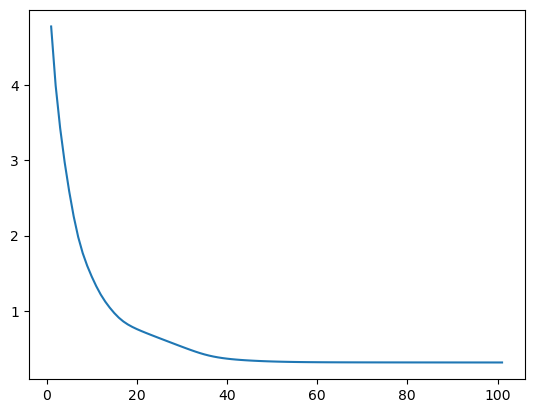

In [55]:
import matplotlib.pyplot as plt

x = epocas
y = mean_categorical_cross_entropy_loss_history

plt.plot(x, y)
plt.show()